<a href="https://colab.research.google.com/github/jesminmousumy/Python-Programming/blob/main/Analysis_of_Global_COVID_19_Data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from datetime import datetime
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.linear_model import LinearRegression

# 1. Data Acquisition and Preparation
# Load the dataset from the GitHub repository
url = "https://raw.githubusercontent.com/owid/covid-19-data/master/public/data/owid-covid-data.csv"
df = pd.read_csv(url)

In [ ]:
# Inspect the dataset
print(df.head())
print(df.info())

  iso_code continent     location        date  total_cases  new_cases  \
0      AFG      Asia  Afghanistan  2020-01-05          0.0        0.0   
1      AFG      Asia  Afghanistan  2020-01-06          0.0        0.0   
2      AFG      Asia  Afghanistan  2020-01-07          0.0        0.0   
3      AFG      Asia  Afghanistan  2020-01-08          0.0        0.0   
4      AFG      Asia  Afghanistan  2020-01-09          0.0        0.0   

   new_cases_smoothed  total_deaths  new_deaths  new_deaths_smoothed  ...  \
0                 NaN           0.0         0.0                  NaN  ...   
1                 NaN           0.0         0.0                  NaN  ...   
2                 NaN           0.0         0.0                  NaN  ...   
3                 NaN           0.0         0.0                  NaN  ...   
4                 NaN           0.0         0.0                  NaN  ...   

   male_smokers  handwashing_facilities  hospital_beds_per_thousand  \
0           NaN            

In [ ]:
# Data Cleaning
# Handle missing values (e.g., fill with zeros or drop)
df.fillna(0, inplace=True)

# Convert date column to datetime format
df['date'] = pd.to_datetime(df['date'])

In [ ]:
# Feature Engineering
# Extract day of the week, month, and year
df['weekday'] = df['date'].dt.day_name()
df['month'] = df['date'].dt.month
df['year'] = df['date'].dt.year

# Compute 7-day rolling averages for cases and vaccinations
df['rolling_avg_cases'] = df['new_cases'].rolling(window=7).mean()
df['rolling_avg_vaccinations'] = df['new_vaccinations'].rolling(window=7).mean()

        total_cases  total_deaths  total_vaccinations
count  4.294350e+05  4.294350e+05        4.294350e+05
mean   7.062901e+06  7.792336e+04        1.117248e+08
std    4.387137e+07  4.323391e+05        8.516241e+08
min    0.000000e+00  0.000000e+00        0.000000e+00
25%    3.849000e+03  2.600000e+01        0.000000e+00
50%    5.093700e+04  6.630000e+02        0.000000e+00
75%    6.727790e+05  8.737000e+03        0.000000e+00
max    7.758668e+08  7.057132e+06        1.357877e+10


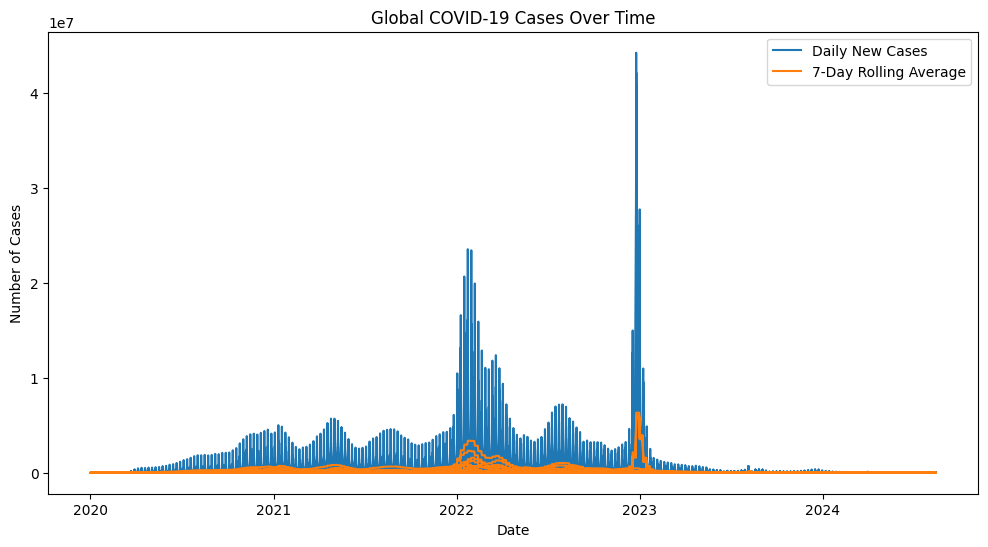

In [ ]:
# 2. Exploratory Data Analysis (EDA)
# Descriptive Statistics
print(df[['total_cases', 'total_deaths', 'total_vaccinations']].describe())

# Trend Analysis: Time-series plots
plt.figure(figsize=(12, 6))
plt.plot(df['date'], df['new_cases'], label='Daily New Cases')
plt.plot(df['date'], df['rolling_avg_cases'], label='7-Day Rolling Average')
plt.title('Global COVID-19 Cases Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Cases')
plt.legend()
plt.show()

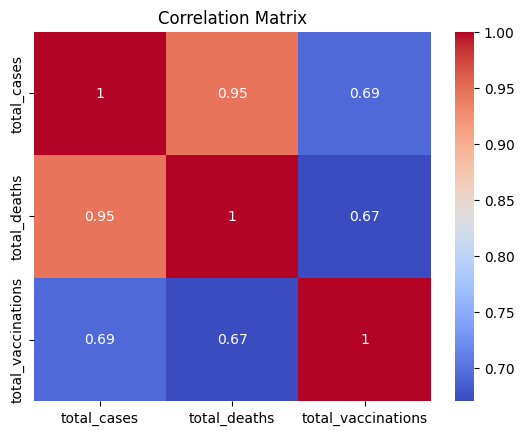

In [ ]:
# Correlation Analysis
correlation_matrix = df[['total_cases', 'total_deaths', 'total_vaccinations']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

In [ ]:
# 3. Geospatial Analysis
# Choropleth map for total cases
fig = px.choropleth(df, locations="iso_code", color="total_cases",
                    hover_name="location", animation_frame="date",
                    title="Global COVID-19 Cases Over Time")
fig.show()

In [ ]:
# Hotspot Identification: Countries with highest new cases
hotspots = df.groupby('location')['new_cases'].max().sort_values(ascending=False).head(10)
print("Top 10 COVID-19 Hotspots:")
print(hotspots)

Top 10 COVID-19 Hotspots:
location
World                            44236227.0
Asia                             42142424.0
Upper-middle-income countries    40975782.0
China                            40475477.0
High-income countries            16140087.0
Europe                           11040888.0
European Union (27)               8867064.0
North America                     6582043.0
United States                     5650933.0
Lower-middle-income countries     3156093.0
Name: new_cases, dtype: float64


In [ ]:
# 4. Predictive Modeling
# Time-Series Forecasting (ARIMA model for a specific country)
country_data = df[df['location'] == 'United States'].set_index('date')
train_data = country_data['new_cases'][:-30]
test_data = country_data['new_cases'][-30:]

In [ ]:
# Fit ARIMA model
model = ARIMA(train_data, order=(5, 1, 0))
model_fit = model.fit()
forecast = model_fit.forecast(steps=30)

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.



In [ ]:
# Evaluate model performance
mse = mean_squared_error(test_data, forecast)
mae = mean_absolute_error(test_data, forecast)
print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Error: {mae}")

Mean Squared Error: 0.0
Mean Absolute Error: 1.46497609224e-313


In [ ]:
# Regression Analysis: Predict cases based on vaccination rate
X = df[['total_vaccinations']]
y = df['total_cases']
reg_model = LinearRegression()
reg_model.fit(X, y)
print(f"Regression Coefficient: {reg_model.coef_}")

Regression Coefficient: [0.03567]


In [ ]:
# 5. Reporting and Presentation
# Save the cleaned dataset for dashboard creation
df.to_csv('cleaned_covid_data.csv', index=False)